<a href="https://colab.research.google.com/github/VuongTuanKhanh/Funix-Capstone-Project/blob/main/notebooks/Dataset_EDA_and_Download.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://user-images.githubusercontent.com/26833433/125273437-35b3fc00-e30d-11eb-9079-46f313325424.png">

This is the **official notebook 🚀** by [Tuan Khanh](https://github.com/VuongTuanKhanh), and is freely available for redistribution under the [MIT license](https://opensource.org/licenses/MIT). 

This tutorial will help you build objects detections models easily in the cloud with **GPU** enabled so that you can run real-time object detections as well as train your very own custom object detector!

First of all, you will need to enable **GPU** acceleration within your **Colab Notebook** so that your system will be able to process detections over 100 faster than **CPU**.

<details>

- Click **Edit** at top left of your notebook

![image.png](https://raw.githubusercontent.com/VuongTuanKhanh/Funix-Capstone-Project/main/images/gpu_1.png)

- Click **Notebook Settings** within dropdown

![image.png](https://raw.githubusercontent.com/VuongTuanKhanh/Funix-Capstone-Project/main/images/gpu_2.png)

- Under 'Hardware Accelerator' select **GPU** and then hit **Save**

![image.png](https://raw.githubusercontent.com/VuongTuanKhanh/Funix-Capstone-Project/main/images/gpu_3.png)

Your notebook should now have GPU enabled!

</details>

For more information please visit https://github.com/VuongTuanKhanh/Funix-Capstone-Project. Thank you!

# 🤫 Setting Up

## Create Google Drive repository

In [1]:
import json
import random
import os, sys
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = 25, 25
from random import randrange, choice
from IPython.display import display, clear_output, HTML

We will need to mount with **Google Drive** as we treat it as a local file. Whether you are using **Jupyter Notebook** instead of **Google Colab**, you can skip this step. 

However, since our data set is huge, it would not be feasible to store it locally. Instead, I recommend using **Google Drive** as a cloud storage drive, which will help us store more efficiently and access it more easily in the future.

In [2]:
# Check the ipython interpreter is being used
if 'google.colab' in str(get_ipython()):
    # Import Library
    from google.colab import drive
    # Mounting Drive Folder
    try:
        drive.mount('/content/drive')
    except:
        print("Mounting Fail")
    else:
        print("Mouting Success")
    finally:
        print("Mounting process is completed")

    # Define the path to the Google Drive Folder
    drive_path = "/content/drive/MyDrive/Funix-Capstone-Project"

    # Clone the repo if the folder whether it is not existed
    if not os.path.exists(drive_path):
        # Install 'git' module if needed
        try:
            from git import Repo
        except ModuleNotFoundError:
            import sys, subprocess
            print("Installing 'git' module")
            subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'gitpython'])

        # Import 'repo' from 'git' module
        from git import Repo
        # Create project folder
        os.mkdir(drive_path)
        # Clone the repo
        Repo.clone_from("https://github.com/VuongTuanKhanh/Funix-Capstone-Project", drive_path)
        print("Cloning git repo")


    # Navigate to the folder
    os.chdir(drive_path)

Mounted at /content/drive
Mouting Success
Mounting process is completed


To run the project, you need to install the packages specified in the requirements section. 

The installation will be done automatically when all the packages have been specified in advance and done through the shell command, automatically installed into the Linux operating system of the virtual machine.

In [3]:
# Install the required package
!pip install -r ./requirements.txt > /dev/null

# Clearing the output
clear_output()

## Accessing AOT Dataset

After we have finished setting up the environment, we will proceed to access the data. Detailed information on the data as well as example steps of exploration can be found [here](https://github.com/VuongTuanKhanh/Funix-Capstone-Project/wiki/About-the-AOT-dataset) and [here](https://github.com/VuongTuanKhanh/Funix-Capstone-Project/blob/main/notebooks/Dataset_Exploration.ipynb). For more information you can refer to my Github Repo Wiki located at https://github.com/VuongTuanKhanh/Funix-Capstone-Project


We will need to load the details of all flights based on the grouthtruth information provided in the original dataset. Execution will be done automatically based on my self-defined library in the core directory, including setting up paths as well as loading grouthtruth information for all flights. This information is then saved into a single object for easy access.


Note, it is necessary to consider loading the whole data or just a part of the data when the original data set is really large, up to 13Tb, making it sometimes impossible to load and store each record. Instead, you can choose to load a partial data including 500Gb of valid encounters via the `partial=True` option.


Detailed information about the dataset as well as `grouthtruth` and `valid_encounter` formats can be found [here](https://github.com/VuongTuanKhanh/Funix-Capstone-Project/wiki/Downloading-AOT-dataset).

In [4]:
from core.helper import *

# Initialize the enviroment
initialize(42)

# Loading the dataset and save to a variable
# Whether you want to load the entire dataset, use partial=False
dataset = load_data()

# Print out the dataset
print(dataset)

2021-08-31 04:45:58.118 | INFO     | core.dataset:load_gt:28 - Loading ground truth...
2021-08-31 04:46:30.394 | INFO     | core.dataset:load_gt:28 - Loading ground truth...
2021-08-31 04:47:00.500 | INFO     | core.dataset:load_gt:28 - Loading ground truth...


Dataset(num_flights=3438)


# EDA

And now, for the first step of the **EDA** process, let's check how many types of objects are there in the dataset.

In [5]:
unique_keys = get_unique_keys(dataset)
print(unique_keys)

['Flock', 'Helicopter', 'Bird', 'Airborne', 'Drone', 'Airplane']


Next, we will create a complete dataframe for easy manipulation. This dataframe is generated from the file grouthtruth.json, and is implemented in a self-defined library.



In [6]:
import pandas as pd

# Create a dataframe by using self-define function
df = make_dataframe(dataset, ['flight_id', 'object_type', 'object', 'frame_id', 'left', 'top', 'width', 'height', 'area', 'image_path','range_distance'])
# Get the first 5 flights
df.head()

,flight_id,object_type,object,frame_id,left,top,width,height,area,image_path,range_distance
0,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,212,0.0,206.4,13.2,16.0,211.20,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
1,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,213,3.6,181.4,33.0,59.8,1973.40,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
2,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,214,3.8,198.6,62.0,57.6,3571.20,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
3,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,215,3.4,185.4,87.2,79.2,6906.24,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
4,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,216,30.0,203.2,93.6,77.0,7207.20,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN


Let's check for the type of every dimension

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2312262 entries, 0 to 2312261
Data columns (total 11 columns):
 #   Column          Dtype  
---  ------          -----  
 0   flight_id       object 
 1   object_type     object 
 2   object          object 
 3   frame_id        int64  
 4   left            float64
 5   top             float64
 6   width           float64
 7   height          float64
 8   area            float64
 9   image_path      object 
 10  range_distance  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 194.1+ MB


""


We may also want to have a look on the value range of each column

In [8]:
df.describe()

,frame_id,left,top,width,height,area,range_distance
count,2.312262e+06,2.312262e+06,2.312262e+06,2.312262e+06,2.312262e+06,2.312262e+06,1.085460e+06
mean,5.758232e+02,1.220994e+03,9.049987e+02,1.601170e+01,1.282479e+01,8.545766e+02,1.478421e+03
std,3.354459e+02,5.857159e+02,3.107863e+02,4.093310e+01,1.830630e+01,2.218396e+04,1.145123e+03
min,2.000000e+00,0.000000e+00,0.000000e+00,1.400000e+00,1.400000e+00,6.000000e+00,5.905806e+00
25%,2.890000e+02,8.068190e+02,7.272077e+02,6.000000e+00,6.000000e+00,3.600000e+01,5.937808e+02
50%,5.660000e+02,1.250991e+03,9.612966e+02,1.400000e+01,6.852112e+00,1.325568e+02,1.179687e+03
75%,8.570000e+02,1.638583e+03,1.110275e+03,1.600000e+01,1.600000e+01,2.560000e+02,2.063207e+03
max,1.202000e+03,2.445000e+03,2.045000e+03,2.436631e+03,1.232231e+03,2.803834e+06,9.399926e+03


Checking for null data is also extremely important as lost information can cause certain difficulties in data processing. Here, it's great that we don't have any nan values. As for the value in the `range_distance` column, the nan values ​​represent unplanned airborne objects, so we can choose to delete it depending on the benchmark we are doing.

More details about dataset are [here](https://github.com/VuongTuanKhanh/Funix-Capstone-Project/wiki/Downloading-AOT-dataset)

In [85]:
pd.DataFrame(df.isna().sum(), columns=['count'])

,count
flight_id,0
object_type,0
object,0
frame_id,0
left,0
top,0
width,0
height,0
area,0
image_path,0


And as we see here, we will have to deal with a set of 2312262 flights, with 11 properties each flight.

In [12]:
df.shape

(2312262, 11)

Luckily, we have no duplicated flights in out dataset

In [19]:
df.duplicated().sum()

0

And now, let check for the specific value of each `object_type`

In [27]:
import pandas as pd
object_types = pd.DataFrame(df['object_type'].value_counts())
object_types

,object_type
Helicopter,952496
Airplane,627699
Airborne,452032
Bird,265027
Flock,13234
Drone,1774


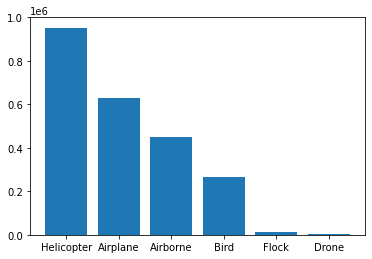

In [30]:
import matplotlib.pyplot as plt
plt.bar(object_types.index, object_types['object_type'])
plt.show()

As we see here, `Helicopter` and `Airplane` make up most of the dataset, with a very small percentage of `Flock`, `Bird`, and `Drone`. `Airborne` defines unidentified and unlabeled flying objects, which are clearly defined [here](https://github.com/VuongTuanKhanh/Funix-Capstone-Project/wiki/Downloading-AOT-dataset).

Finally, for demo purpose, we may want to get a random frame and have it annotated.

1469 1126 1485 1142


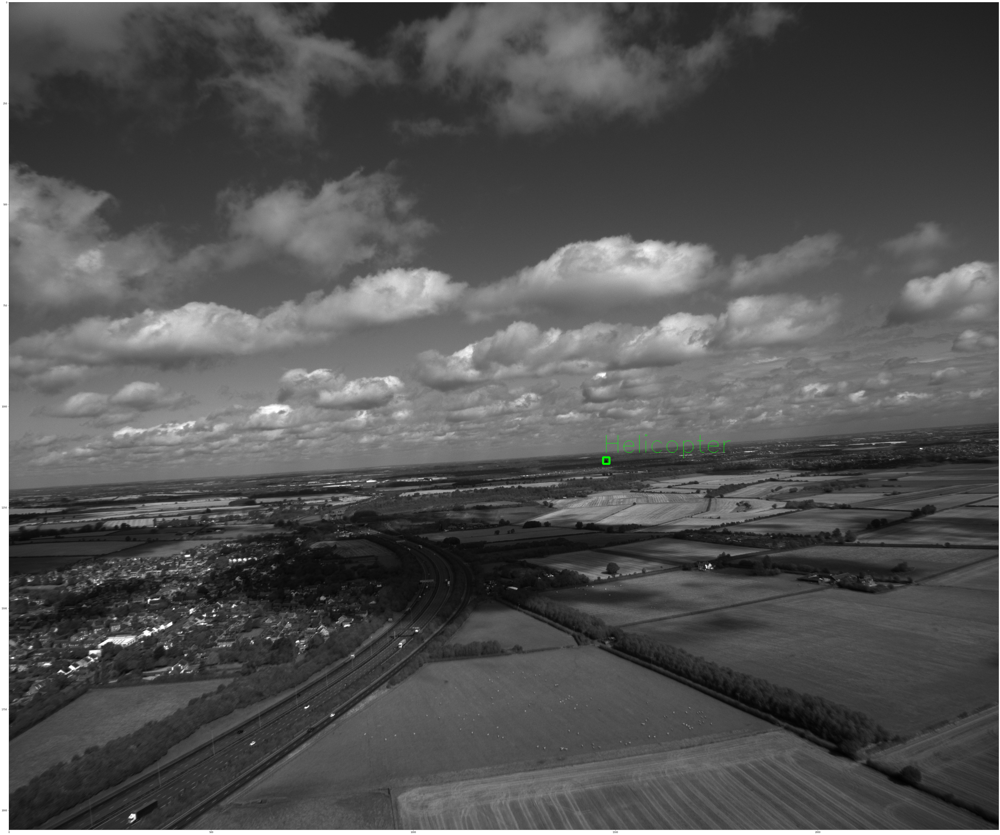

In [81]:
import os
plt.rcParams["figure.figsize"] = 25, 25

# Get a random flight
random_flight_id = df.sample()["flight_id"].values[0]
random_flight = dataset.get_flight_by_id(random_flight_id)
# Get a specific frame of that flight
frame = random_flight.frames[df.sample()["frame_id"].values[0]]

# Define the absolute path to the selected frame
image_path = frame.image_path()

color = (0,255,0)
path_to_img = None

# Verify whether that frame is downloaded
for path in ['data/part1', 'data/part2', 'data/part3']:
    img_path = os.path.join(img_root,image_path)
    if os.path.exists(img_path):
        path_to_img = img_path
        break

frame_df = df[df["image_path"] == image_path]
boxes = []
# Get objects in the frame
for idx, ob in frame_df.iterrows():
  label,left,top,width,height = ob['object_type'],ob['left'],ob['top'],ob['width'],ob['height']
  # Get location of each object
  box = {}
  box['left'] = left
  box['top'] = top
  box['width'] = width
  box['height'] = height
  box['label'] = label
  boxes.append(box)

# Verify whether that frame is downloaded
if path_to_img != None:
    drawBoundingBoxes(os.path.join(img_root,image_path),'output.png',boxes,color)

# Download images for training

As we see, our dataset is really `noise` with tons of `tiny object`.

So now, we will filter data points by relevant `Airborne Objects (Airplane, Helicopter)` and pick objects larger than a certain value. 

In [ ]:
# Filter for 'Helicopter' and 'Airplane'
filtered_df = df.loc[((df['object_type'] == 'Helicopter') | (df['object_type'] == 'Airplane'))]

# Take only the object that larger than 400 in the area
filtered_df = filtered_df.loc[df['area'] > 400]

# Get all index of 'Helicopter' and 'Airplane'
flights = filtered_df.index[(filtered_df['object_type'] == 'Airplane')]
helicopters = filtered_df.index[(filtered_df['object_type'] == 'Helicopter')]

# Create a dictionary that store all image path
counts_dict = dict(filtered_df['image_path'].value_counts())
# Define frames that have more than 1 object
multi_object_frames = filtered_df[filtered_df.apply(lambda x:counts_dict[x['image_path']] > 1, axis=1)].index

# Create a train dataframe make up of only 'Helicopter' and 'Airplane'
train_indices = list(flights) + list(helicopters)
train_df = filtered_df.loc[list(set(train_indices))]

# Have a look on the first 5 lines of created dataframe
filtered_df.head()

,flight_id,object_type,object,frame_id,left,top,width,height,area,image_path,range_distance
1,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,213,3.6,181.4,33.0,59.8,1973.40,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
2,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,214,3.8,198.6,62.0,57.6,3571.20,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
3,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,215,3.4,185.4,87.2,79.2,6906.24,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
4,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,216,30.0,203.2,93.6,77.0,7207.20,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN
5,63c5597a57b04b448723f1f1844a2b78,Airplane,Airplane2,217,59.8,211.6,91.0,76.8,6988.80,Images/63c5597a57b04b448723f1f1844a2b78/156084...,NaN


Finally, we will download all of the selected images above.

In [ ]:
# Create a list of need-to-download images
download_images = []

# Iter through the training dataset
for idx in range(len(train_df)):
    # Get flight and frame
    flight = dataset.flights[train_df.iloc[idx]['flight_id']]
    frame = flight.frames[train_df.iloc[idx]['frame_id']]

    # Define local and s3 path
    image_path = frame.image_path()
    s3_path = frame.image_s3_path()

    # Add to the list
    download_images.append([image_path, image_path])

# Shuffle to make it random
random.shuffle(download_images)

In [ ]:
from tqdm import tqdm
# Download all the images in parallel from s3 server
for idx in tqdm(range(100)):
  dataset.file_handler.download_from_s3_parallel(download_images[idx])

100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Once you have completed all these steps, you will see that the data folder will now contain a lot of folders, each representing a flight. Also, each flight directory will include only frames containing objects. This will save you a lot of resources compared to downloading the whole thing.

# 💟 Thanks!
Thanks for following along this tutorial, I hope it worked well for all of you!